In [27]:
import numpy as np
from scipy.sparse.linalg import svds
from PIL import Image

(2091, 3718)
7774338


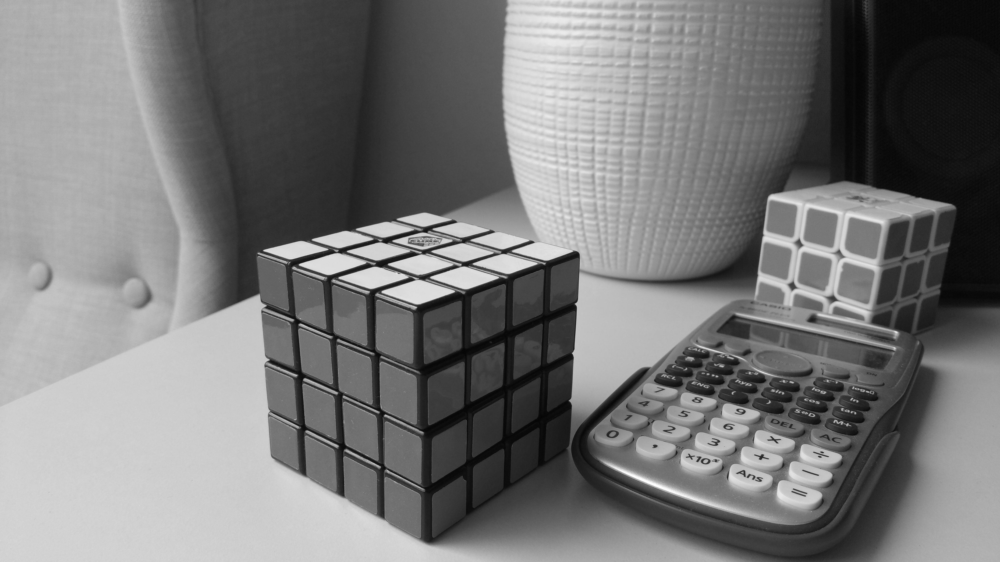

In [26]:
im = Image.open('rubiks0.jpg').convert('L')
im.thumbnail((im.size[0] * 0.7, im.size[1] * 0.7))
im_arr = np.array(im).astype('uint8')
img_size = im_arr.shape

print(img_size)
print(im_arr.size)
im

### Inefficient way:

In [17]:
def n_pc_image(im_arr, n):
    U, S, Vh = np.linalg.svd(im_arr)
    
    im_compressed_arr = np.array([0 for i in range(7774338)]).astype('float64').reshape(img_size)

    for i in range(n):
        im_compressed_arr += S[i] * U[:, i].reshape(-1, 1) @ Vh[i].reshape(1, -1)
    
    return im_compressed_arr

In [24]:
im_compr = Image.fromarray(n_pc_image(im_arr, 10))

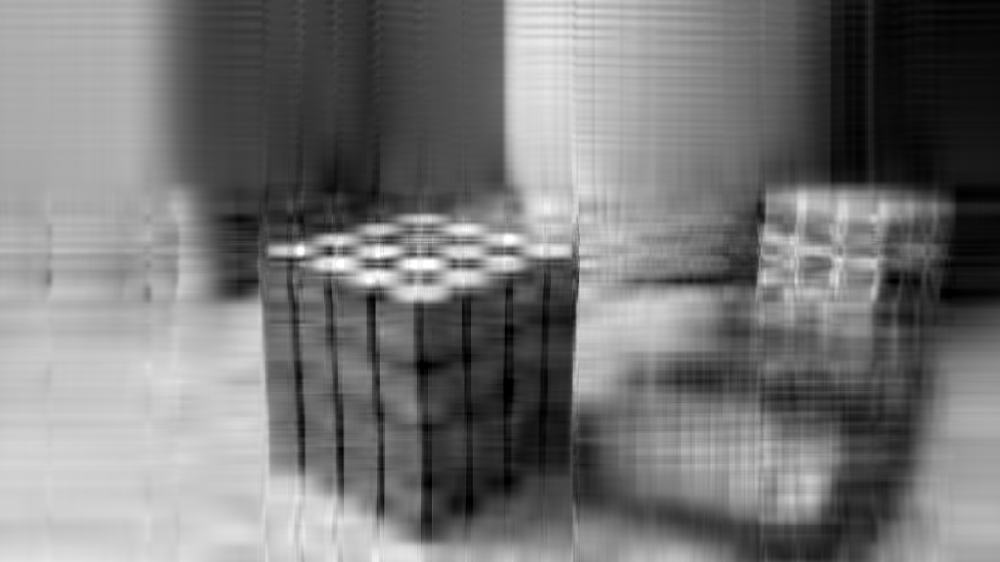

In [25]:
im_compr.convert('RGB')

In [52]:
def pca_image_compression(im_arr, size=None, variance=None, pc=None):
    # compute principal components
    U, S, Vh = np.linalg.svd(im_arr)
    N_PCs = 0
    
    if variance:
        total_var = np.sum(S)        
        
        best_npc = 0
        best_abs = 99999999
        
        for n_pc in range(len(S)):
            abs_var_diff = np.abs(variance - np.sum(S[:n_pc]) / total_var)
            if abs_var_diff  < best_abs:
                N_PCs = n_pc
                best_abs = abs_var_diff
            else:
                break

    elif size:
        N_PCs = int(size * len(S))
    elif pc:
        N_PCs = pc
    else:
        N_PCs = 10
    
    U = U[:, :N_PCs]
    S = S[:N_PCs]
    Vh = Vh[:N_PCs]
    
    img_arr_compressed = U @ np.diag(S) @ Vh
    return img_arr_compressed

In [71]:
img_compressed = Image.fromarray(pca_image_compression(im_arr, size=0.1))

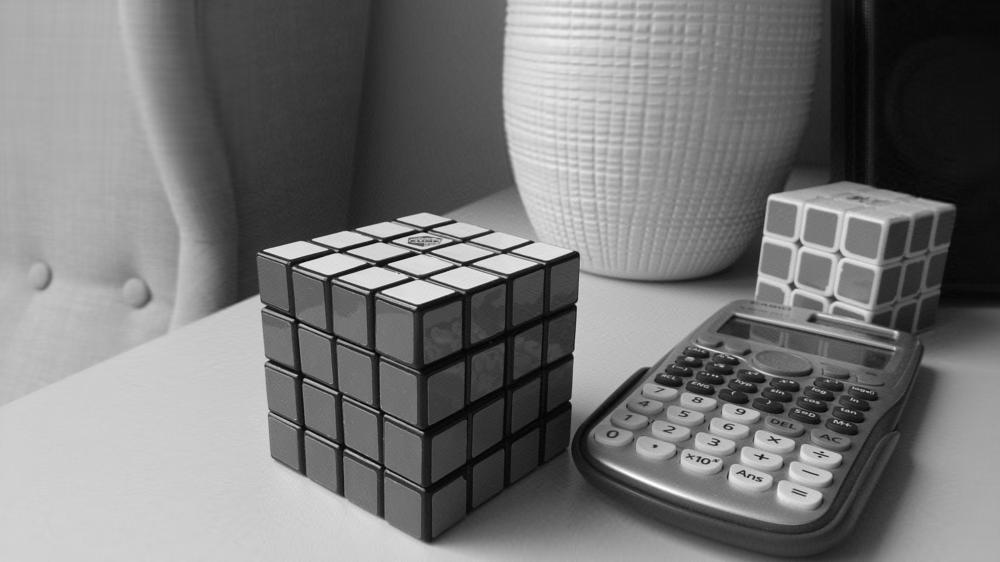

In [72]:
img_compressed.convert('RGB')

In [74]:
img_compressed = Image.fromarray(pca_image_compression(im_arr, variance=0.6))

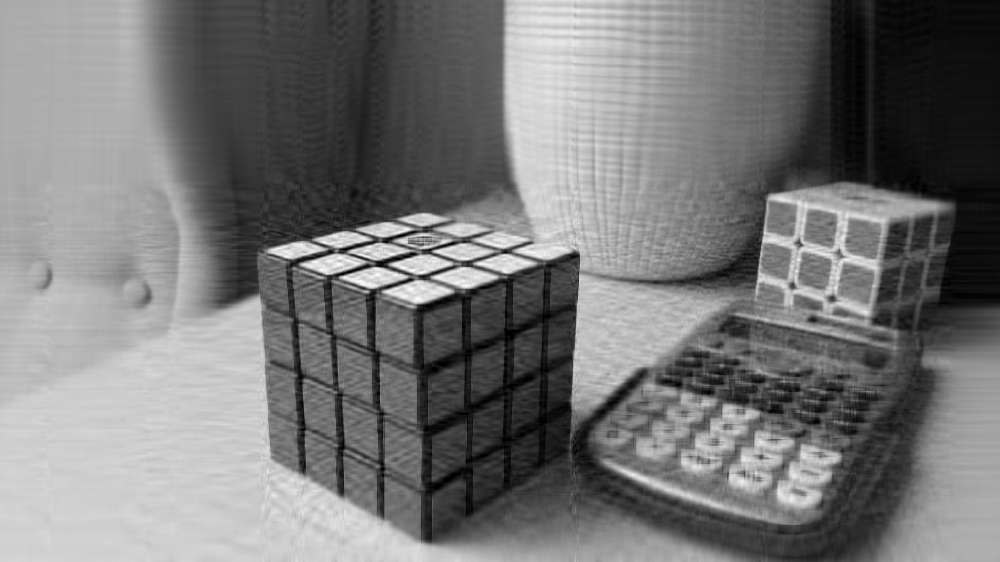

In [75]:
img_compressed.convert('RGB')

In [ ]:
def projection_compression(im_arr, N_PCs):
    # to be continued
    pass